<a href="https://colab.research.google.com/github/MarkLimmage/AustralianSharePrices/blob/main/MA5851_A3_Mark_Limmage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
!pip install selenium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 985 kB 4.2 MB/s 
     |████████████████████████████████| 139 kB 54.1 MB/s 
     |████████████████████████████████| 358 kB 57.1 MB/s 
     |████████████████████████████████| 58 kB 5.5 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
requests 2.23.0 requires urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you have urllib3 1.26.11 which is incompatible.


In [ ]:
!apt-get update # to update ubuntu to correctly run apt install
!apt install chromium-chromedriver
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
import sys
sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')
from selenium import webdriver
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
wd = webdriver.Chrome('chromedriver',chrome_options=chrome_options)

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease [1,581 B]
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Packages [910 kB]
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelea

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: use options instead of chrome_options
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
import re
import json
import csv
from io import StringIO
from bs4 import BeautifulSoup
import requests
import pandas as pd
from tqdm.notebook import tqdm

import re
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import dateutil.parser as dp
import time
import math
import concurrent.futures
import multiprocessing
from multiprocessing import Pool

from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.by import By


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
allords = pd.DataFrame(pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/allords.csv', encoding = "ISO-8859-1"))
allords

,code,company
0,360,LIFE360 Inc
1,3DP,Pointerra Ltd
2,A200,Betashares Australia 200 ETF
3,A2M,The a2 Milk Company Ltd
4,A4N,Alpha Hpa Ltd
...,...,...
493,XRO,Xero Ltd
494,YAL,Yancoal Australia Ltd
495,Z1P,ZIP Co Ltd
496,ZEL,Z Energy Ltd


In [ ]:
company_url = 'https://au.finance.yahoo.com/quote/{}?p={}'
headers = { 'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/71.0.3578.98 Safari/537.36' }

soup = dict()

articles = pd.DataFrame( columns=['company', 'article_url', 'pub_time'])
errors = pd.DataFrame( columns=['company', 'script'] )
for index, row in tqdm(allords.iterrows(), total=allords.shape[0]):
  company = str(row['code']) + '.AX'
  json_key = str('YFINANCE:'+ company + '.mega')
  page = company_url.format(company,company)
  response = requests.get(page, headers=headers)
  soup = BeautifulSoup(response.text, 'html.parser')
  pattern = re.compile(r'\s--\sData\s--\s')
  script_data=soup.find('script', text=pattern).contents[0]
  company_page = json.loads(script_data[112:-12])
  try:  
    items = company_page['context']['dispatcher']['stores']['StreamStore']['streams'][json_key]['data']['stream_items']
    for item in items:
      try:
        # print(company, item['url'], item['pubtime'])
        articles = articles.append({'company':company, 'article_url':item['url'], 'pub_time':item['pubtime']}, ignore_index = True)
      except:
        pass
  except Exception as e: 
    errors = errors.append({'company':company, 'script':company_page}, ignore_index=True)
      



100%|██████████| 498/498 [14:30<00:00,  1.75s/it]


In [ ]:
# Save this to disk so we don't have to run the query again (~10 min)
articles.to_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/articles.csv')
errors.to_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/errors.csv')

In [ ]:
articles = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/articles.csv')
errors = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/errors.csv')

In [ ]:
print('stocks:', len(allords), ' | ', 'articles:',articles.shape[0],' | ', 'errors:', errors.shape[0])

stocks: 498  |  articles: 2958  |  errors: 35


In [ ]:
articles

,Unnamed: 0,company,article_url,pub_time
0,0,360.AX,https://au.finance.yahoo.com/news/type-shareho...,1660082471000
1,1,360.AX,https://au.finance.yahoo.com/news/life360-asx-...,1655347315000
2,2,360.AX,https://au.finance.yahoo.com/news/life360-asx-...,1651457394000
3,3,360.AX,https://au.finance.yahoo.com/news/au-5-90-life...,1648799910000
4,4,360.AX,https://au.finance.yahoo.com/news/apple-google...,1647522008000
...,...,...,...,...
2953,2953,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1652240144000
2954,2954,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1646801023000
2955,2955,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1642047389000
2956,2956,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1637199612000


In [ ]:

headers = { 'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/71.0.3578.98 Safari/537.36' }

soup = dict()
article_errors = list()

articles['story'] = ''
article_errors = pd.DataFrame( columns=['article', 'script'] )
for index, row in tqdm(articles.iterrows(), total=articles.shape[0]):
  page = row['article_url']
  response = requests.get(page, headers=headers)
  soup = BeautifulSoup(response.text, 'html.parser')
  try:  
    article_div=soup.find_all('div', class_='caas-body')[0]
    articles.loc[index, 'story'] = str(article_div)[23:-7]
  except Exception as e: 
    article_errors.append([index])

100%|██████████| 2958/2958 [42:05<00:00,  1.17it/s]


In [ ]:
articles.shape

(2958, 5)

In [ ]:
articles.to_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/stories.csv')

In [ ]:
stories = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/stories.csv')

In [ ]:
stories = articles

In [ ]:
stories

,Unnamed: 0,Unnamed: 0.1,company,article_url,pub_time,story
0,0,0,360.AX,https://au.finance.yahoo.com/news/type-shareho...,1660082471000,<p>If you want to know who really controls Lif...
1,1,1,360.AX,https://au.finance.yahoo.com/news/life360-asx-...,1655347315000,"<p>Warren Buffett famously said, 'Volatility i..."
2,2,2,360.AX,https://au.finance.yahoo.com/news/life360-asx-...,1651457394000,<p>The simplest way to benefit from a rising m...
3,3,3,360.AX,https://au.finance.yahoo.com/news/au-5-90-life...,1648799910000,"<p>Life360, Inc. (<a class=""link "" data-ylk=""s..."
4,4,4,360.AX,https://au.finance.yahoo.com/news/apple-google...,1647522008000,<p>(Bloomberg) -- A push in Congress to regula...
...,...,...,...,...,...,...
2953,2953,2953,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1652240144000,<p>Zimplats Holdings' (ASX:ZIM) stock is up by...
2954,2954,2954,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1646801023000,<p>What are the early trends we should look fo...
2955,2955,2955,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1642047389000,"<p>When you buy shares in a company, it's wort..."
2956,2956,2956,ZIM.AX,https://au.finance.yahoo.com/news/zimplats-hol...,1637199612000,<p>Zimplats Holdings' (ASX:ZIM) stock is up by...


In [ ]:
from platform import python_version
print(python_version())

3.7.13


In [ ]:
def cleanhtml(raw_html):
  cleanr = re.compile('<.*?>')
  cleantext = re.sub(cleanr, '', raw_html)
  return cleantext

def remove_by_regex(texts, regexp):
        output_texts = regexp.sub("",texts)
        return output_texts
    
def remove_urls(input_text):
        return remove_by_regex(input_text, re.compile(r"http.?://[^\s]+[\s]?"))
    
def text_preprocessing(uncleaned_text):  
    review = cleanhtml(str(uncleaned_text))  
    review = re.sub('[^a-zA-Z0-9]', ' ', review)
    review = review.lower()
    review = remove_urls(review)
    review = review.split()
    #ps = PorterStemmer()
    #all_stopwords = stopwords.words('english')
    #all_stopwords.remove('not')
    #review = [ps.stem(word) for word in review if not word in set(all_stopwords)]
    review = ' '.join(review)
    return review

    

In [ ]:
stories['clean_story'] = stories['story'].apply(lambda x: text_preprocessing(x) )

In [ ]:
stories['clean_story']

0       if you want to know who really controls life36...
1       warren buffett famously said volatility is far...
2       the simplest way to benefit from a rising mark...
3       life360 inc asx 360 might not be a large cap s...
4       bloomberg a push in congress to regulate digit...
                              ...                        
2953    zimplats holdings asx zim stock is up by a con...
2954    what are the early trends we should look for t...
2955    when you buy shares in a company it s worth ke...
2956    zimplats holdings asx zim stock is up by a con...
2957    what trends should we look for it we want to i...
Name: clean_story, Length: 2958, dtype: object

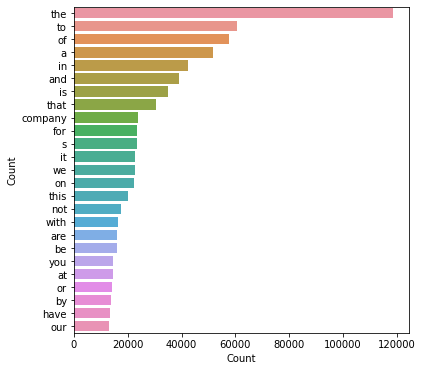

In [ ]:

corpus = list()
all_words = ' '.join([text for text in stories['clean_story']]) 
all_words = all_words.split() 

all_words = nltk.FreqDist(all_words)

# create dataframe
all_words_df = pd.DataFrame({'Category': list(all_words.keys()), 
                              'Count': list(all_words.values())})
g = all_words_df.nlargest(columns="Count", n = 25) 
plt.figure(figsize=(6,6)) 
ax = sns.barplot(data=g, x= "Count", y = "Category") 
ax.set(ylabel = 'Count') 
plt.show()

In [ ]:
all_words_df

,Category,Count
0,if,8618
1,you,14691
2,want,1663
3,to,60717
4,know,1675
...,...,...
32351,483m,1
32352,711m,1
32353,797m,1
32354,rocezimplats,1


In [ ]:
corpus = ""
for c_story in stories['clean_story']:
  corpus = corpus + c_story

# corpus = set(corpus)

wtokens = nltk.word_tokenize(str(corpus))
print(len(wtokens))     # Number of words in text 

fdist = nltk.FreqDist(wtokens)

fdist

2420708


'if you want to know who really controls life360 inc asx 360 then you ll have to look at the makeup of its share registry generally speaking as a company grows institutions will increase their ownership conversely insiders often decrease their ownership over time i generally like to see some degree of insider ownership even if only a little as nassim nicholas taleb said don t tell me what you think tell me what you have in your portfolio life360 is a smaller company with a market capitalization of au 952m so it may still be flying under the radar of many institutional investors taking a look at our data on the ownership groups below it seems that institutions are noticeable on the share registry we can zoom in on the different ownership groups to learn more about life360 see our latest analysis for life360 ownership breakdownwhat does the institutional ownership tell us about life360 many institutions measure their performance against an index that approximates the local market so they

In [ ]:
fdist

FreqDist({'the': 118261, 'to': 60695, 'of': 57700, 'a': 51532, 'in': 42429, 'and': 39011, 'is': 34777, 'that': 30382, 'company': 23726, 'for': 23459, ...})

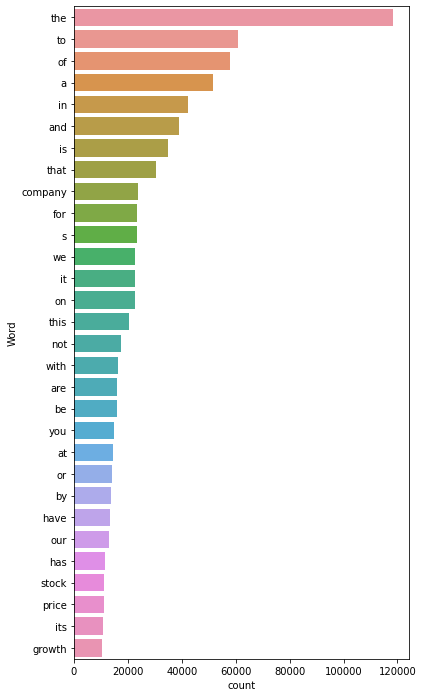

In [ ]:

def freq_words(x, terms = 30): 
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())}) 
  
  # selecting top 20 most frequent words 
  d = words_df.nlargest(columns="count", n = terms) 
  
  # visualize words and frequencies
  plt.figure(figsize=(6,12)) 
  ax = sns.barplot(data=d, x= "count", y = "word") 
  ax.set(ylabel = 'Word') 
  plt.show()
  
freq_words(wtokens)

In [ ]:
print('Processed:', len(list(fdist.keys())), ' | Raw:', len(corpus))

Processed: 32942  | Raw: 14092378


# Adding the Motley Fool data



### Try to get an article link from a ticker page

In [ ]:
s = wd.find_element(By.CLASS_NAME, "articles-listing")
s = s.find_element(By.TAG_NAME, "main")
s = s.find_elements(By.TAG_NAME, "a")
s = s[0].get_attribute('href')

In [ ]:


last = wd.find_element(By.CLASS_NAME, "page-numbers.last")
last = last.get_attribute('href')
last = int(last.split('/')[-2])
last

78

In [ ]:
s

'https://www.fool.com.au/2022/08/19/here-are-the-top-10-asx-200-shares-today-22/'

### Now try to get the article text from the linked article

In [ ]:
wd.get(s)

In [ ]:
try:
  category = ''
except:
  category = ''
try:
  title = wd.find_element(By.CLASS_NAME, "entry-title").text
except:
  title=''
try:
  time = wd.find_element(By.CLASS_NAME, "entry-date.published")
  time = time.get_attribute('datetime')
  time = dp.parse(time).timestamp()

except:
  time = ''
try:
  body = wd.find_element(By.CLASS_NAME, "entry-content.nitro-offscreen").text
except:
  body = ''
try:
  key_points = wd.find_element(By.ID, "key-points")
except:
  key_points = ''
print('category:',category,' | title:',title,' | time:',time,' | key points:',key_points,' | body:',body)

category:   | title: Here are the top 10 ASX 200 shares today  | time: 1660891523.0  | key points:   | body: The S&P/ASX 200 Index (ASX: XJO) ended the week with a wobbly performance despite strong gains among energy shares. The index closed Friday’s session 0.02% higher at 7,114.5 points.
That marks a 1.16% gain for the week and the ASX 200 closed four out of five sessions in the green.
The S&P/ASX 200 Energy Index (ASX: XEJ) soared 4% on Friday, likely on the back of rising oil prices and concerns a European energy crisis could increase demand for coal. The Brent crude oil price lifted 3.1% to US$96.59 a barrel overnight while the US Nymex crude oil price rose 2.7% to US$90.50 a barrel.
It wasn’t such a good day on the S&P/ASX 200 Utilities Index (ASX: XUJ). It fell 0.7% as AGL Energy Limited (ASX: AGL) released its earnings and APA Group (ASX: APA) revealed a $32 million impairment.
Speaking of earnings, TPG Telecom Ltd (ASX: TPG) shares slumped on the telco’s results while Cochlear

## OK Now get the articles from Motley 
Iterate over the asx listed companies, get the urls for the articles, then build a df with all the text.

In [ ]:

motley_2 = pd.DataFrame( columns=['company', 'article_url', 'category', 'pub_time', 'title', 'time', 'key_points', 'body'])

In [ ]:
motley_2 = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/motley_2.csv')
motley_2.drop(['Unnamed: 0'], axis=1)

,company,article_url,category,pub_time,title,time,key_points,body
0,360,https://www.fool.com.au/2022/08/17/down-40-thi...,NaN,NaN,NaN,NaN,NaN,NaN
1,360,https://www.fool.com.au/2022/08/16/here-are-th...,NaN,NaN,NaN,NaN,NaN,NaN
2,360,https://www.fool.com.au/2022/08/16/why-bhp-lif...,NaN,NaN,NaN,NaN,NaN,NaN
3,360,https://www.fool.com.au/2022/08/16/life360-sha...,NaN,NaN,NaN,NaN,NaN,NaN
4,360,https://www.fool.com.au/2022/08/12/2-exciting-...,Growth Shares,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
37083,ZIM,https://www.fool.com.au/2022/05/04/3-asx-share...,Value Investing,NaN,NaN,NaN,NaN,NaN
37084,ZIM,https://www.fool.com.au/2022/04/11/heres-why-t...,Resources Shares,NaN,NaN,NaN,NaN,NaN
37085,ZIM,https://www.fool.com.au/2022/04/11/here-are-th...,Share Market News,NaN,NaN,NaN,NaN,NaN
37086,ZIM,https://www.fool.com.au/2022/04/08/here-are-th...,Share Market News,NaN,NaN,NaN,NaN,NaN


In [ ]:
company_url = 'https://www.fool.com.au/tickers/asx-{}{}/'
skip = True
for index, row in tqdm(allords.iterrows(), total=allords.shape[0]):
  company = str(row['code'])  
  if(skip):
    if(company != 'MOE'):
      continue
    else:
      skip = False
  w_page = company_url.format(company,'')
  wd.implicitly_wait(4)
  wd.get(w_page)
  try:
    last = wd.find_element(By.CLASS_NAME, "page-numbers.last")
    last = last.get_attribute('href')
    last = int(last.split('/')[-2])
    if(last > 15 ):
      last = 15
  except:
    last = 2
  try:
    articles = wd.find_element(By.CLASS_NAME, "articles-listing")
    articles = articles.find_element(By.TAG_NAME, "main")
    articles = articles.find_elements(By.TAG_NAME, "a")
  except:
    continue
  print('comapny:',company,'pages:',last,'df length:', len(motley_2))  
  for article in articles:
    
    try:
      category = article.find_element(By.CLASS_NAME, "category")
      category = category.text
    except:
      category = ''
    motley_2 = motley_2.append({'company':company,
                            'article_url':article.get_attribute('href'),
                            'category': category
                            }, ignore_index=True)
  for i in range(2,last):
      print(i)
      w_page = company_url.format(company,"/page/"+str(i))
      wd.implicitly_wait(4)
      wd.get(w_page)
      wd.implicitly_wait(4)
      try:
        articles = wd.find_element(By.CLASS_NAME, "articles-listing")
        articles = articles.find_element(By.TAG_NAME, "main")
        articles = articles.find_elements(By.TAG_NAME, "a")
        for article in articles:
          
          try:
            category = article.find_element(By.CLASS_NAME, "category")
            category = category.text
          except:
            category = ''
          motley_2 = motley_2.append({'company':company,
                                  'article_url':article.get_attribute('href'),
                                  'category': category
                                  }, ignore_index=True)
      except:
        pass
  motley_2.to_csv('/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/motley_2.csv')


   



  0%|          | 0/498 [00:00<?, ?it/s]

comapny: MOE pages: 4 df length: 20967
2
3
comapny: MP1 pages: 15 df length: 20975
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MPL pages: 15 df length: 21087
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MQG pages: 15 df length: 21199
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MSB pages: 15 df length: 21311
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MTS pages: 15 df length: 21423
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MVA pages: 2 df length: 21535
comapny: MVP pages: 15 df length: 21536
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: MVW pages: 2 df length: 21648
comapny: MYS pages: 6 df length: 21656
2
3
4
5
comapny: MYX pages: 15 df length: 21696
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: NAB pages: 15 df length: 21808
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: NAN pages: 15 df length: 21920
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: NCK pages: 15 df length: 22032
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: NCM pages: 15 df length: 22144
2
3
4
5
6
7
8
9
10
11
12
13
14
comapny: NDQ pages: 15 df length: 22256
2
3
4
5
6
7

## Get the rest of the fields from Motley Fool


In [ ]:
motley_2

In [ ]:
from selenium import webdriver
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
wd = webdriver.Chrome('chromedriver',options=chrome_options)

#Iterate through the articles collecting the rest of the fields:
def get_motley_data(partition,motley_2):
  for index, row in tqdm(motley_2.iterrows(), total=motley_2.shape[0]):
    url = str(row['article_url'])  
    wd.implicitly_wait(4)
    wd.get(url)  
    try:    
      title = wd.find_element(By.CLASS_NAME, "entry-title").text
    except:
      title=''
    try:    
      time = wd.find_element(By.CLASS_NAME, "entry-date.published")
      time = time.get_attribute('datetime')
      time = int(dp.parse(time).timestamp())
    except:
      time = ''
    try:    
      crumb = wd.find_element(By.CLASS_NAME, "breadcrumb-tmc")
      last = len(crumb.find_elements(By.TAG_NAME, 'a'))-1
      last = crumb.find_elements(By.TAG_NAME, 'a')[last]
      category = last.text
    except:
      category = ''    
    try:
      wd.implicitly_wait(4)    
      body = wd.find_element(By.CLASS_NAME, "entry-content.nitro-offscreen").text
    except:      
      body = ''
    try:    
      key_points = wd.find_element(By.ID, "key-points").text[11:]
    except:
      key_points = ''
    print(partition,index,title)  
    motley_2.loc[index,['title','time','key_points','body','category']] = [title,time,key_points,body,category]
    if(int(index) % 50 == 0):
      path = '/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/motley_4_{}.csv'
      motley_2.to_csv(path.format(str(partition)))
  path = '/content/drive/MyDrive/Colab Notebooks/MA5851/assessments/A2/motley_4_{}.csv'
  motley_2.to_csv(path.format(str(partition)))
  wd.close()     



In [ ]:
n=18
data = []
partition = int(motley_2.shape[0]/n)
for i in range(n):
  data.append( motley_2[(i*partition):((i+1)*partition)] )
d_dict = zip(list(range(len(data))),data)


def browser():  
    driver = webdriver.Chrome()
    return driver

def m_main():
  # create processes
  processes = [multiprocessing.Process(target=get_motley_data, args=[i,d]) for i,d in d_dict]
  # start the processes
  for process in processes:
      process.start()  
  # wait for completion
  for process in processes:
      process.join()




def do():
    pool = multiprocessing.Pool(6)
    for i in range(0,6):
        pool.apply_async( get_motley_data, args = (i, data[i]) )
    pool.close()
    pool.join()
    




    

In [ ]:
for i in range(0,6):
  print(i)

0
1
2
3
4
5


In [ ]:
 if __name__ == '__main__':
     do()

Streaming output truncated to the last 5000 lines.
1 2384 2 strong blue chip ASX shares rated as buys
3 6441 Why I like ASX consumer staples shares in the current climate
5 10575 ASX 200 healthcare shares provided some pain relief today. Here’s why
24446  What ASX shares might be affected by the UK-Australia trade deal?
4 8511 ASX 200 finishes down 2% on Tuesday
0 342 Why A2 Milk, AGL, Endeavour, and TPG shares are charging higher
1 2385 Why the Aristocrat Leisure (ASX:ALL) share price is one to watch today
2 4447 Why the wheels are falling off the Carbon Revolution (ASX:CBR) share price today
5 10576 What’s the outlook for the CSL share price in July?
3 6442 These were the worst performing shares on the ASX 200 last week
0 343 A2 Milk (ASX:A2M) share price jumps 12% on ‘improved’ outlook
4 8512 ASX 200 lunch update: G8, Wesfarmers, & Westpac higher
1 2386 5 things to watch on the ASX 200 on Monday
2 4448 Why the Autosports (ASX:ASG) share price tumbled 7% today
5 10577 Has CSL been gr

[{1: 3279,3: 7237,0: 1237,2: 5304,5: 11345,4: 9289,1: 3280}]
 

In [ ]:
progress = {0: 1237,1: 3280,2: 5304,3: 7237,4: 9289,5: 11345}
progress

{0: 1237, 1: 3280, 2: 5304, 3: 7237, 4: 9289, 5: 11345}

In [ ]:
for k in progress:
  print(progress[k])


1237
3280
5304
7237
9289
11345


In [ ]:
n=18
data = []
partition = int(motley_2.shape[0]/n)
for k in progress:
  data.append( motley_2[int(progress[k]):((k+1)*partition)] )
d_dict = zip(list(range(len(data))),data)

def do():
    pool = multiprocessing.Pool(6)
    for i in range(0,6):
        pool.apply_async( get_motley_data, args = (i, data[i]) )
    pool.close()
    pool.join()

    
    


In [ ]:
data[0]

,Unnamed: 0,company,article_url,category,pub_time,title,time,key_points,body
1237,1237,AEF,https://www.fool.com.au/2021/09/14/the-austral...,NaN,NaN,NaN,NaN,NaN,NaN
1238,1238,AEF,https://www.fool.com.au/2021/09/01/the-austral...,NaN,NaN,NaN,NaN,NaN,NaN
1239,1239,AEF,https://www.fool.com.au/2021/08/26/australian-...,NaN,NaN,NaN,NaN,NaN,NaN
1240,1240,AEF,https://www.fool.com.au/2021/08/18/2-rapidly-g...,NaN,NaN,NaN,NaN,NaN,NaN
1241,1241,AEF,https://www.fool.com.au/2021/08/13/is-your-por...,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2055,2055,ALC,https://www.fool.com.au/2019/12/04/5-exciting-...,Speculative,NaN,NaN,NaN,NaN,NaN
2056,2056,ALC,https://www.fool.com.au/2019/11/21/3-exciting-...,NaN,NaN,NaN,NaN,NaN,NaN
2057,2057,ALC,https://www.fool.com.au/2019/11/19/why-the-alc...,NaN,NaN,NaN,NaN,NaN,NaN
2058,2058,ALC,https://www.fool.com.au/2019/11/08/insiders-ha...,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
 if __name__ == '__main__':
     do()

Streaming output truncated to the last 5000 lines.
4 9378 ASX 200 rises, Cimic (ASX:CIM) share price climbs
5 11441 5 ASX shares hitting record all-time highs this week
2 5398 1Why Aurizon, Cochlear, Magellan, & Westpac shares are pushing higher 
3383 2 ASX dividend shares that could provide steady income in retirement
3 7332 3 rapidly growing ASX shares to buy in October
0 1329 Leading brokers name 3 ASX shares to buy today
1 3384 2 ASX dividend shares with very long dividend growth records
3 7333 Bigtincan (ASX:BTH) share price dips despite new contract
2 5399 The latest ASX stocks leading brokers are urging you to buy today5
 11442 2 of the best ASX dividend shares you can buy in October
4 9379 ASX 200 down 0.2%: Big four banks drop, CIMIC jumps, CSL slides lower
0 1330 Top fundie names these 2 ASX shares as buys
1 3385 The 10 ASX dividend shares delivering the highest yields
3 7334 3 rapidly growing ASX tech shares to buy
0 1331 Wilson Asset Management (WAM) thinks these 2 ASX shar